In [2]:
# pip install scanpy squidpy cell2location[tutorials]

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import scanpy as sc
import cell2location as c2l
import seaborn as sns
import matplotlib.pyplot as plt
# import spatial_utils as uti

/usr/local/lib/python3.11/dist-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/usr/local/lib/python3.11/dist-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
2025-05-07 13:01:20.155303: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746622880.598158      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746622880.729666      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [7]:
# import squidpy as sq

In [8]:
!ls /kaggle/input/cell2location

adata_sc.h5ad			__notebook__.ipynb
adata_st.h5ad			__output__.json
cfg.txt				__pycache__
custom.css			raw_count_matrices
decon_adata_st.h5ad		raw_count_matrices.tar.gz
decon_metadata.csv		raw_sc
fet				__results___files
filtered_count_matrices		__results__.html
filtered_count_matrices.tar.gz	spatial
filtered_count_matrix		spatial.tar.gz
inf_aver.csv			spatial_utils.py
metadata.csv			wget-log
my_r_libs			Whole_miniatlas_umap.coords.tsv


In [10]:
adata_sc= sc.read_h5ad('/kaggle/input/cell2location/adata_sc.h5ad')
adata_sc

AnnData object with n_obs × n_vars = 42512 × 10390
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_names', 'feature_types', 'n_cells', 'nonz_mean', 'MT_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'X_umap'
    layers: 'counts', 'raw_counts'

In [93]:
adata_st= sc.read_h5ad('/kaggle/input/cell2location/decon_adata_st.h5ad')
adata_st

AnnData object with n_obs × n_vars = 4895 × 10390
    obs: 'nCount_RNA', 'nFeature_RNA', 'patientid', 'subtype', 'Classification', 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', '_indices', '_scvi_batch', '_scvi_labels', 'B-cells', 'CAFs', 'Cancer Epithelial', 'Endothelial', 'Myeloid', 'Normal Epithelial', 'PVL', 'Plasmablasts', 'T-cells'
    var: 'gene_names', 'feature_types', 'MT_gene'
    uns: 'Classification_colors', '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'MT', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [ ]:
adata_row= sc.read_10x_mtx('/kaggle/input/honda/single_cell')
meta= pd.read_csv('/kaggle/input/honda/single_cell/Whole_miniatlas_meta.csv', sep=',')
meta.drop(axis = 0, index= 0, inplace=True)
meta.set_index('NAME', inplace =True)
adata_row.obs = meta

umap =pd.read_csv('/kaggle/input/cell2location/Whole_miniatlas_umap.coords.tsv',sep='\t', header=0)
umap.drop(axis = 0, index= 0, inplace=True)
umap.set_index('NAME', inplace = True)
umap = umap.astype(float)

adata_row.obsm['X_umap'] = umap.to_numpy()
adata_row= adata_row[adata_row.obs['subtype']=='TNBC']

In [68]:
marker_genes = ["ERBB2", "ESR1", "PGR"]  # HER2, Estrogen receptor, Progesterone receptor

In [69]:
df = sc.get.obs_df(adata_row, keys= marker_genes)

In [70]:
df['celltype_minor'] = adata_row.obs['celltype_minor']

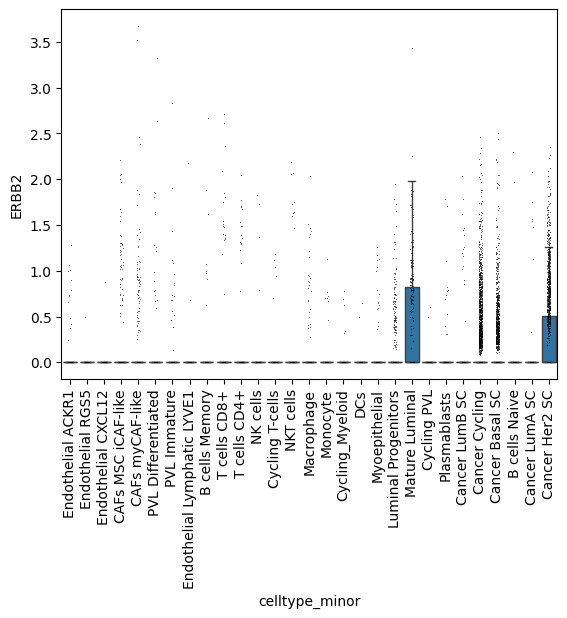

In [71]:
sns.boxplot(data=df, x='celltype_minor', y='ERBB2', showfliers=False)
sns.stripplot(data=df, x='celltype_minor', y='ERBB2', color='black', size=0.5, jitter=True)
plt.xticks(rotation=90)
plt.show()

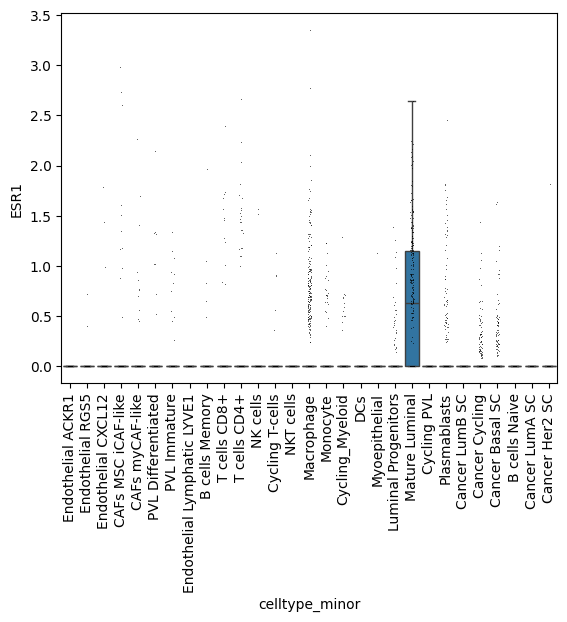

In [72]:
sns.boxplot(data=df, x='celltype_minor', y='ESR1', showfliers=False)
sns.stripplot(data=df, x='celltype_minor', y='ESR1', color='black', size=0.5, jitter=True)
plt.xticks(rotation=90)
plt.show()

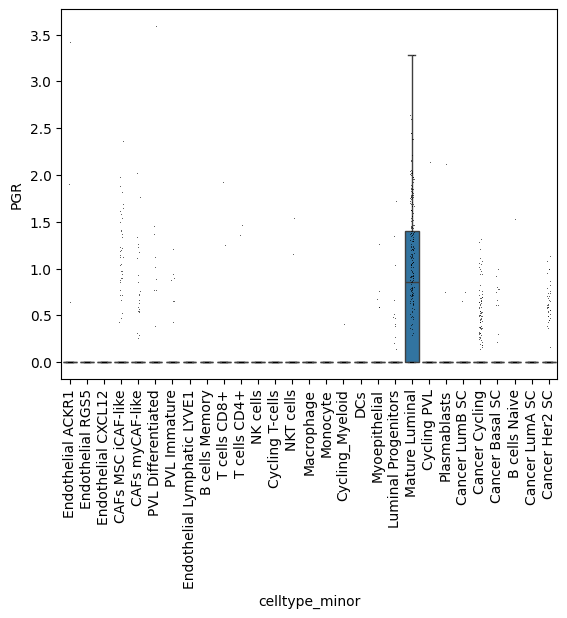

In [73]:
sns.boxplot(data=df, x='celltype_minor', y='PGR', showfliers=False)
sns.stripplot(data=df, x='celltype_minor', y='PGR', color='black', size=0.5, jitter=True)
plt.xticks(rotation=90)
plt.show()

In [78]:
adata_sc

AnnData object with n_obs × n_vars = 42512 × 10390
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_names', 'feature_types', 'n_cells', 'nonz_mean', 'MT_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid'
    obsm: 'X_umap'
    layers: 'counts', 'raw_counts'

In [79]:
c2l.models.RegressionModel.setup_anndata(
    adata=adata_sc,
    batch_key="Patient",
    labels_key="celltype_minor",
    layer = 'raw_counts')

/usr/local/lib/python3.11/dist-packages/scvi/data/fields/_layer_field.py:115: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)


In [83]:
model = c2l.models.RegressionModel(adata_sc)
# default, try on GPU:
# use_gpu = True
model.train(max_epochs=250, batch_size=2500, train_size=1, lr=0.002, accelerator="gpu")

INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Training:   0%|          | 0/250 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=250` reached.


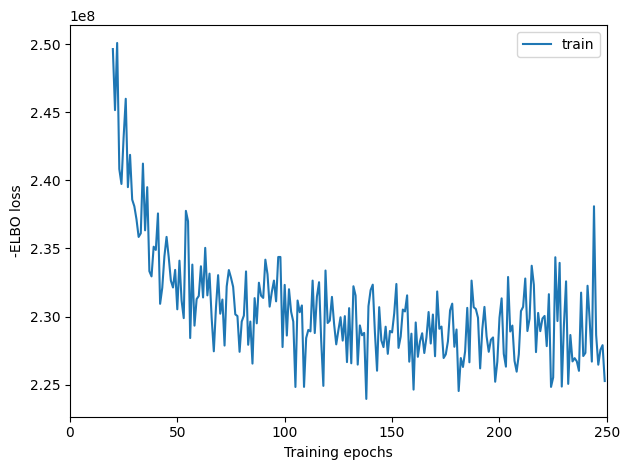

In [84]:
model.plot_history(20)

In [85]:
model.export_posterior(
    adata_sc,
    sample_kwargs={"num_samples": 1000, "batch_size": 2500, "accelerator": 'gpu'},
)

INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/18 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

AnnData object with n_obs × n_vars = 42512 × 10390
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_names', 'feature_types', 'n_cells', 'nonz_mean', 'MT_gene'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod'
    obsm: 'X_umap'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'
    layers: 'counts', 'raw_counts'

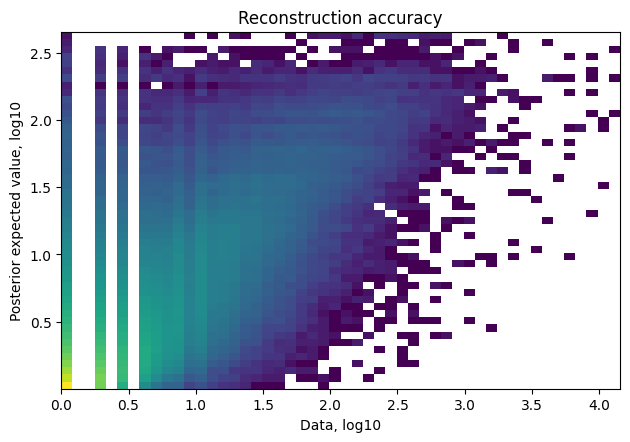

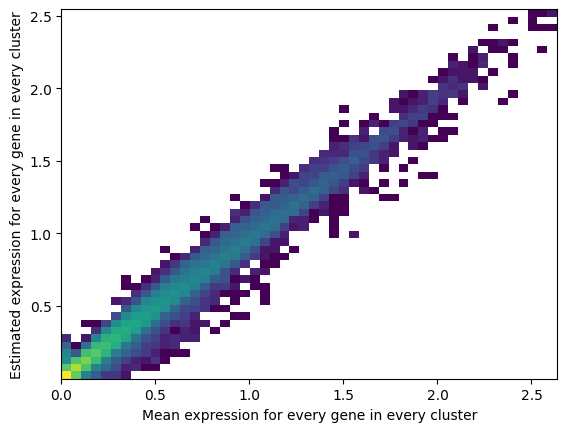

In [86]:
model.plot_QC()

In [87]:
# export estimated expression in each cluster
if "means_per_cluster_mu_fg" in adata_sc.varm.keys():
    inf_aver = adata_sc.varm["means_per_cluster_mu_fg"][
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()
else:
    inf_aver = adata_sc.var[
        [f"means_per_cluster_mu_fg_{i}" for i in adata_sc.uns["mod"]["factor_names"]]
    ].copy()

inf_aver.columns = adata_sc.uns["mod"]["factor_names"]
inf_aver.head()

,B cells Memory,B cells Naive,CAFs MSC iCAF-like,CAFs myCAF-like,Cancer Basal SC,Cancer Cycling,Cancer Her2 SC,Cancer LumA SC,Cancer LumB SC,Cycling PVL,...,Mature Luminal,Monocyte,Myoepithelial,NK cells,NKT cells,PVL Differentiated,PVL Immature,Plasmablasts,T cells CD4+,T cells CD8+
gene_ids,,,,,,,,,,,,,,,,,,,,,
ENSG00000188976,0.113909,0.113449,0.164255,0.233095,0.787444,1.187264,0.924700,0.204040,0.301916,0.475683,...,0.481898,0.105499,0.187984,0.073814,0.083635,0.119156,0.137727,0.111987,0.069897,0.070415
ENSG00000188290,0.002844,0.002806,0.237929,0.602322,1.157504,2.128811,1.786865,0.623616,0.418568,1.917139,...,1.186925,0.254144,0.145409,0.015703,0.023467,0.985066,1.064946,0.006585,0.005683,0.004545
ENSG00000187608,0.492329,0.175705,2.143567,4.300113,1.700439,0.925872,1.014686,0.435292,0.093542,3.071767,...,0.520731,2.803312,0.562471,0.903702,0.416021,1.782303,3.530917,0.315162,0.482357,0.964134
ENSG00000188157,0.004162,0.001673,0.048136,0.149433,0.309188,0.407049,0.522387,0.247994,0.160886,0.349565,...,0.303682,0.021941,0.305620,0.001647,0.004689,0.120667,0.394182,0.002184,0.000793,0.001457
ENSG00000131591,0.001919,0.002120,0.008547,0.029730,0.085401,0.148935,0.198051,0.063065,0.101657,0.210140,...,0.056355,0.014001,0.034467,0.012347,0.011655,0.008363,0.019955,0.004545,0.005816,0.003196


In [107]:
c2l.models.Cell2location.setup_anndata(
    adata=adata_st,
)

In [108]:
inf_aver

,B cells Memory,B cells Naive,CAFs MSC iCAF-like,CAFs myCAF-like,Cancer Basal SC,Cancer Cycling,Cancer Her2 SC,Cancer LumA SC,Cancer LumB SC,Cycling PVL,...,Mature Luminal,Monocyte,Myoepithelial,NK cells,NKT cells,PVL Differentiated,PVL Immature,Plasmablasts,T cells CD4+,T cells CD8+
gene_ids,,,,,,,,,,,,,,,,,,,,,
ENSG00000188976,0.113909,0.113449,0.164255,0.233095,0.787444,1.187264,0.924700,0.204040,0.301916,0.475683,...,0.481898,0.105499,0.187984,0.073814,0.083635,0.119156,0.137727,0.111987,0.069897,0.070415
ENSG00000188290,0.002844,0.002806,0.237929,0.602322,1.157504,2.128811,1.786865,0.623616,0.418568,1.917139,...,1.186925,0.254144,0.145409,0.015703,0.023467,0.985066,1.064946,0.006585,0.005683,0.004545
ENSG00000187608,0.492329,0.175705,2.143567,4.300113,1.700439,0.925872,1.014686,0.435292,0.093542,3.071767,...,0.520731,2.803312,0.562471,0.903702,0.416021,1.782303,3.530917,0.315162,0.482357,0.964134
ENSG00000188157,0.004162,0.001673,0.048136,0.149433,0.309188,0.407049,0.522387,0.247994,0.160886,0.349565,...,0.303682,0.021941,0.305620,0.001647,0.004689,0.120667,0.394182,0.002184,0.000793,0.001457
ENSG00000131591,0.001919,0.002120,0.008547,0.029730,0.085401,0.148935,0.198051,0.063065,0.101657,0.210140,...,0.056355,0.014001,0.034467,0.012347,0.011655,0.008363,0.019955,0.004545,0.005816,0.003196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000185973,0.015685,0.013830,0.032306,0.058124,0.105681,0.136840,0.113829,0.059566,0.049325,0.146488,...,0.100313,0.055062,0.038335,0.022253,0.008312,0.038987,0.043387,0.018900,0.009043,0.014596
ENSG00000124333,0.038752,0.019788,0.089432,0.166549,0.249942,0.273905,0.146317,0.094930,0.050311,0.391189,...,0.171704,0.123336,0.105477,0.056899,0.067695,0.060760,0.124020,0.047431,0.045866,0.052798
ENSG00000124334,0.001678,0.002035,0.000837,0.001230,0.001188,0.000792,0.000943,0.017216,0.008187,0.146650,...,0.009468,0.000644,0.006769,0.028020,0.008591,0.002226,0.002825,0.000935,0.005185,0.041349


In [96]:
# adata_st.var_names = adata_st.var_names.astype(str)
# inf_aver.index = inf_aver.index.astype(str)
# common_genes = adata_st.var_names.intersection(inf_aver.index)
# adata_st = adata_st[:, common_genes].copy()
# inf_aver = inf_aver.loc[common_genes]

In [109]:
model = c2l.models.Cell2location(
    adata_st,
    cell_state_df=inf_aver,
    N_cells_per_location=5,
)
model.view_anndata_setup()

Anndata setup with scvi-tools version 1.3.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': None,
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 4895  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 10390 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/traine

Training:   0%|          | 0/30000 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=30000` reached.


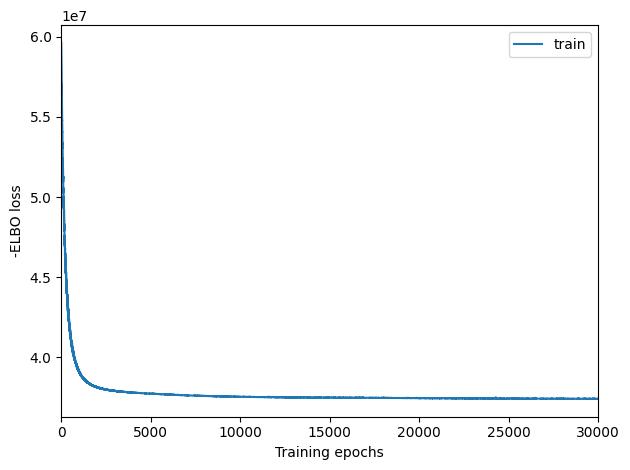

In [110]:
model.train(max_epochs=30000, batch_size=None, train_size=1, accelerator = 'gpu')
# plot training history
model.plot_history()

In [111]:
adata_st = model.export_posterior(
    adata_st,
    sample_kwargs={
        "num_samples": 1000,
        "batch_size": model.adata.n_obs,
        "accelerator": 'gpu',
    },
)

INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling local variables, batch:   0%|          | 0/1 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

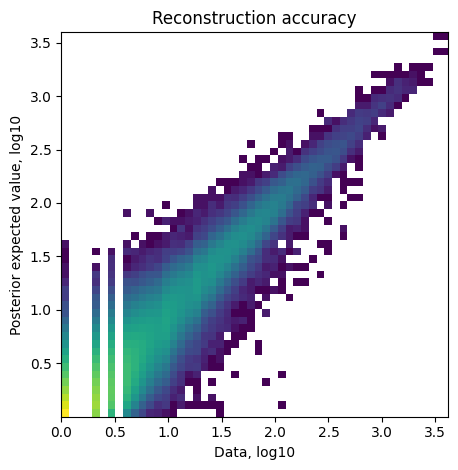

In [112]:
model.plot_QC()

In [113]:
adata_st.obs[adata_st.uns["mod"]["factor_names"]] = adata_st.obsm[
    "q05_cell_abundance_w_sf"
]

/tmp/ipykernel_31/2176177742.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_st,


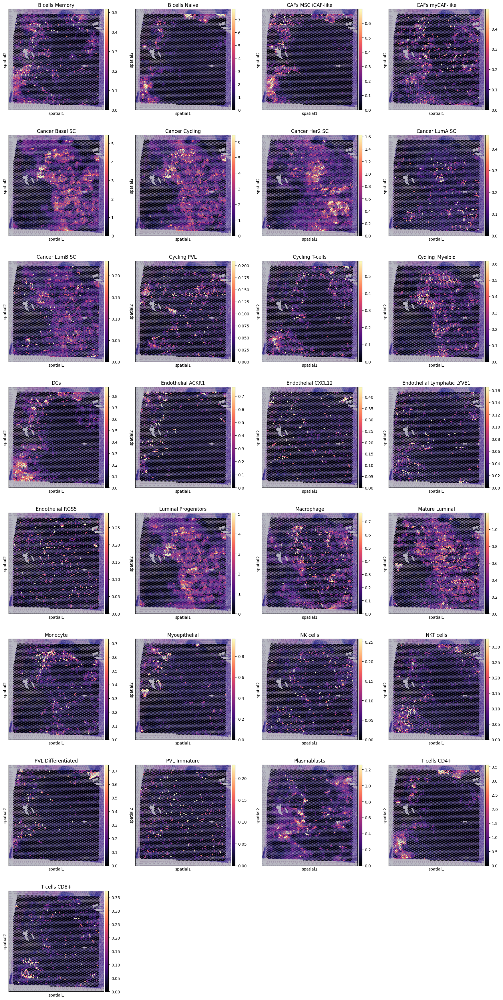

In [114]:
with plt.rc_context({"figure.figsize": [4.5, 5]}):
    sc.pl.spatial(adata_st,
        cmap="magma",
        color=adata_st.uns["mod"]["factor_names"],
        ncols=4,
        size=1.3,
        img_key="hires",
        # limit color scale at 99.2% quantile of cell abundance
        vmin=0,
        vmax="p99.2",
    )

In [115]:
adata_st.obs.to_csv('decon_metadata.csv', header= True, index= True)

In [116]:
adata_st.obsm['spatial']

AnnData object with n_obs × n_vars = 4895 × 10390
    obs: 'nCount_RNA', 'nFeature_RNA', 'patientid', 'subtype', 'Classification', 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', '_indices', '_scvi_batch', '_scvi_labels', 'B-cells', 'CAFs', 'Cancer Epithelial', 'Endothelial', 'Myeloid', 'Normal Epithelial', 'PVL', 'Plasmablasts', 'T-cells', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like', 'CAFs myCAF-like', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling T-cells', 'Cycling_Myeloid', 'DCs', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Macrophage', 'Mature Luminal', 'Monocyte', 'Myoepithelial', 'NK cells', 'NKT cells', 'PVL Differentiated', 'PVL Immature', 'T cells CD4+', 'T cells CD8+'
    var: 'gene_names', 'feature_types', 'MT_gene'
    uns: 'Classification_colors', '_scvi_manager_uuid', '_scvi_uuid', 'mo

In [135]:
df= adata_st.obs.iloc[:,13:]

In [150]:
adata_sc[adata_sc.obs['celltype_major']=='T-cells'].obs['celltype_minor'].unique()

['T cells CD8+', 'T cells CD4+', 'NK cells', 'Cycling T-cells', 'NKT cells']
Categories (5, object): ['Cycling T-cells', 'NK cells', 'NKT cells', 'T cells CD4+', 'T cells CD8+']

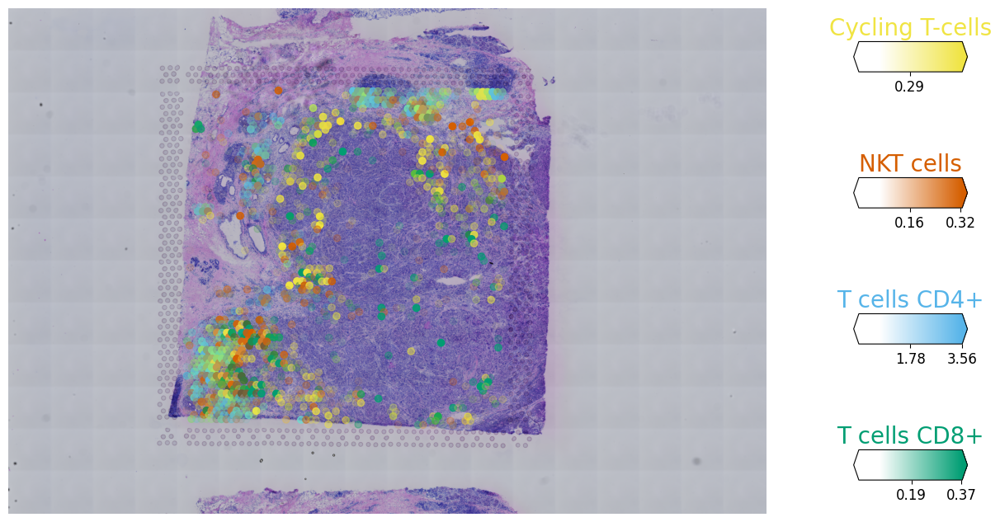

In [152]:
clust_col = ["Cycling T-cells", "NKT cells", "T cells CD4+", "T cells CD8+"]
clust_labels = clust_col

with plt.rc_context({"figure.figsize": (15, 15)}):
    fig = c2l.plt.plot_spatial(
        adata=adata_st,
        color=clust_col,
        labels=clust_labels,
        max_color_quantile=0.992,
        circle_diameter=6,
        show_img=True,
        colorbar_position="right",
        colorbar_shape={"horizontal_gaps": 0.2},
    )

/tmp/ipykernel_31/2122553207.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_st, color = 'Classification')


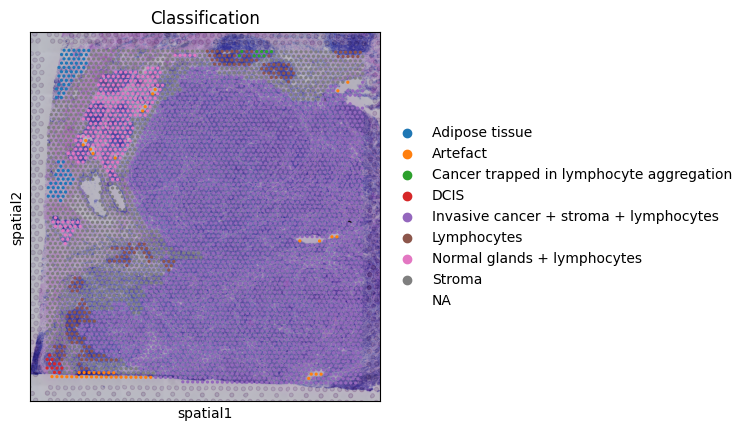

In [153]:
sc.pl.spatial(adata_st, color = 'Classification')

In [164]:
adata_st.write('decon_adata_st.h5ad')

In [154]:
sc.pp.neighbors(adata_st, use_rep="q05_cell_abundance_w_sf")
sc.tl.leiden(adata_st, resolution=0.5)


/tmp/ipykernel_31/3609181797.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_st, resolution=0.5)


In [155]:
adata_st.obs["region_cluster"] = adata_st.obs["leiden"].astype("category")


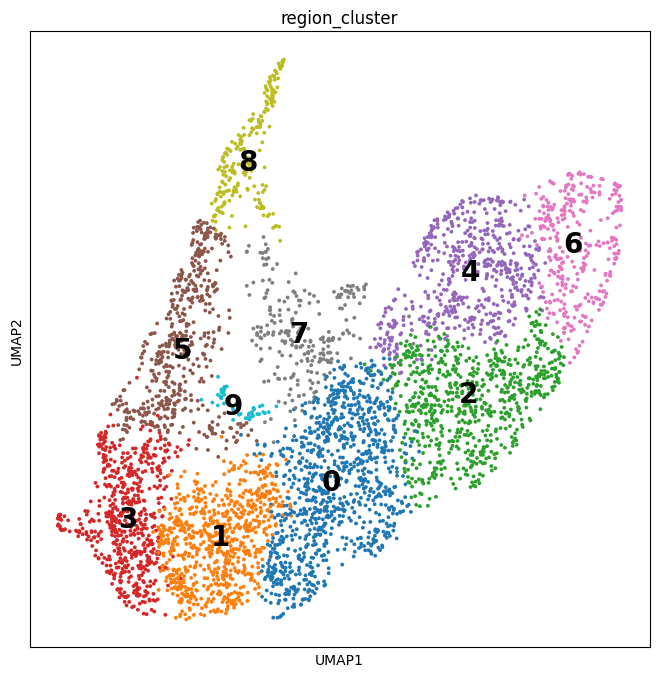

In [156]:
import matplotlib 
sc.tl.umap(adata_st, min_dist=0.3, spread=1)

with matplotlib.rc_context({"axes.facecolor": "white", "figure.figsize": [8, 8]}):
    sc.pl.umap(
        adata_st,
        color=["region_cluster"],
        size=30,
        color_map="RdPu",
        ncols=2,
        legend_loc="on data",
        legend_fontsize=20,
    )



In [162]:
import squidpy as sq

AttributeError: module 'cudf' has no attribute 'utils'

In [163]:
sq.pl.spatial_scatter(adata_st, color="region_cluster", library_key="patient_region_id")


NameError: name 'sq' is not defined